# Generative Models for Pokemon Sprites — VAE vs DCGAN

Comparative study of two generative architectures trained on the [Pokemon sprites dataset](https://pokemondb.net/sprites): a **Variational Autoencoder (VAE)** and a **Deep Convolutional GAN (DCGAN)**.

*Architecture and training setup adapted from [d2l.ai](https://d2l.ai) generative models chapter.*

**Goal:** explore the strengths and weaknesses of each architecture for sprite generation, and compare results across different hyperparameter configurations.

## 1. Setup & Data Loading

In [1]:
# Download the Pokemon sprites dataset
!wget -q http://d2l-data.s3-accelerate.amazonaws.com/pokemon.zip
!unzip -q pokemon.zip

In [2]:
import warnings
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt
from IPython.display import clear_output

warnings.filterwarnings('ignore')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


In [3]:
# Load and prepare data
batch_size = 256
transformer = torchvision.transforms.Compose([
    torchvision.transforms.Resize((64, 64)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(0.5, 0.5)
])

pokemon = torchvision.datasets.ImageFolder('pokemon', transform=transformer)
data_iter = torch.utils.data.DataLoader(pokemon, batch_size=batch_size, shuffle=True, num_workers=2)

print(f'Dataset size: {len(pokemon)} images')

Dataset size: 40597 images


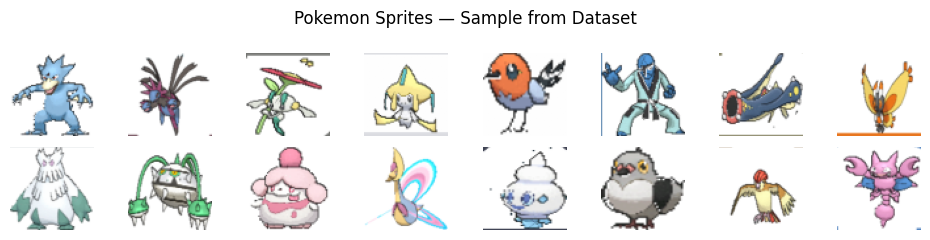

In [4]:
# Visualize sample sprites from the dataset
num_rows, num_cols = 2, 8
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 1.2, num_rows * 1.2), dpi=100)
for X, _ in data_iter:
    imgs = X[:num_rows * num_cols, :, :, :].permute(0, 2, 3, 1) / 2 + 0.5
    for i, img in enumerate(imgs):
        axes[i // num_cols, i % num_cols].imshow(img)
        axes[i // num_cols, i % num_cols].axis('off')
    break
plt.suptitle('Pokemon Sprites — Sample from Dataset')
plt.tight_layout()
plt.show()

## 2. Part 1 — Variational Autoencoder (VAE)

### 2.1 Architecture

Convolutional VAE with 4 conv layers in the encoder, a Gaussian bottleneck (mean + log-variance), and 4 deconv layers in the decoder.

In [5]:
class ConvVAE(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        self.latent_dim = latent_dim

        # Encoder: 3x64x64 -> 256x4x4
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, 2, 1), nn.ReLU(),
            nn.Conv2d(32, 64, 4, 2, 1), nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1), nn.ReLU(),
            nn.Conv2d(128, 256, 4, 2, 1), nn.ReLU(),
        )
        self.fc_mu = nn.Linear(256 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(256 * 4 * 4, latent_dim)

        # Decoder: latent -> 3x64x64
        self.fc_decoder = nn.Linear(latent_dim, 256 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, 2, 1), nn.Sigmoid(),
        )

    def encode(self, x):
        h = self.encoder(x).view(x.size(0), -1)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        return mu + torch.randn_like(std) * std

    def decode(self, z):
        h = self.fc_decoder(z).view(z.size(0), 256, 4, 4)
        return self.decoder(h)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

### 2.2 Training Function

Reusable training loop with periodic visualization of reconstructions.

In [6]:
def vae_loss(recon_x, x, mu, logvar, beta=1.0):
    """VAE loss = reconstruction (MSE) + beta * KL divergence."""
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')
    kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + beta * kld

def train_vae(model, dataloader, num_epochs, lr, device, beta=1.0, viz_every=10):
    """Train a VAE and return the loss history."""
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    losses = []

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for X, _ in dataloader:
            X = X.to(device)
            optimizer.zero_grad()
            recon, mu, logvar = model(X)
            loss = vae_loss(recon, X, mu, logvar, beta=beta)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        avg_loss = total_loss / len(dataloader.dataset)
        losses.append(avg_loss)
        print(f'Epoch {epoch + 1}/{num_epochs} | Loss: {avg_loss:.4f}')

        # Show reconstructions every viz_every epochs
        if (epoch + 1) % viz_every == 0 or epoch == num_epochs - 1:
            visualize_reconstructions(model, dataloader, device)

    return losses

def visualize_reconstructions(model, dataloader, device, n=8):
    """Display original images and their VAE reconstructions side by side."""
    model.eval()
    with torch.no_grad():
        sample = next(iter(dataloader))[0].to(device)[:n]
        recon, _, _ = model(sample)

    fig, axes = plt.subplots(2, n, figsize=(n * 2, 4))
    for i in range(n):
        axes[0, i].imshow(sample[i].cpu().permute(1, 2, 0) * 0.5 + 0.5)
        axes[0, i].axis('off')
        axes[1, i].imshow(recon[i].cpu().permute(1, 2, 0))
        axes[1, i].axis('off')
    axes[0, 0].set_ylabel('Original', fontsize=10)
    axes[1, 0].set_ylabel('Reconstruction', fontsize=10)
    plt.suptitle('Original (top) vs VAE Reconstruction (bottom)')
    plt.tight_layout()
    plt.show()

def sample_vae(model, num_samples=16, device='cpu'):
    """Generate new samples by decoding random latent vectors."""
    model.eval()
    with torch.no_grad():
        z = torch.randn(num_samples, model.latent_dim, device=device)
        samples = model.decode(z).cpu()

    grid_size = int(num_samples ** 0.5)
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(grid_size * 1.5, grid_size * 1.5))
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(samples[i].permute(1, 2, 0))
        ax.axis('off')
    plt.suptitle(f'VAE Samples (latent_dim={model.latent_dim})')
    plt.tight_layout()
    plt.show()

### 2.3 VAE Configurations

Three configurations are compared:

| Config | Latent dim | Epochs | LR |
|--------|-----------|--------|------|
| A | 128 | 50  | 1e-3 |
| B | 256 | 100 | 5e-4 |
| C | 64  | 50  | 1e-3 |

**Hypothesis:** larger latent dimensions should capture more details but may overfit on this small dataset (~40 sprites per class).

#### Configuration A — latent_dim = 128

Epoch 1/50 | Loss: 2414.6921
Epoch 2/50 | Loss: 1676.6611
Epoch 3/50 | Loss: 1406.4400
Epoch 4/50 | Loss: 1266.9459
Epoch 5/50 | Loss: 1185.6458
Epoch 6/50 | Loss: 1134.2077
Epoch 7/50 | Loss: 1094.5878
Epoch 8/50 | Loss: 1066.7508
Epoch 9/50 | Loss: 1042.7296
Epoch 10/50 | Loss: 1022.6985
Epoch 11/50 | Loss: 1006.1973
Epoch 12/50 | Loss: 992.3912
Epoch 13/50 | Loss: 979.6062
Epoch 14/50 | Loss: 968.5585
Epoch 15/50 | Loss: 958.3731
Epoch 16/50 | Loss: 950.0188
Epoch 17/50 | Loss: 942.8584
Epoch 18/50 | Loss: 937.1273
Epoch 19/50 | Loss: 929.2726
Epoch 20/50 | Loss: 924.4426
Epoch 21/50 | Loss: 918.9045
Epoch 22/50 | Loss: 914.2487
Epoch 23/50 | Loss: 909.8676
Epoch 24/50 | Loss: 906.5287
Epoch 25/50 | Loss: 901.3631


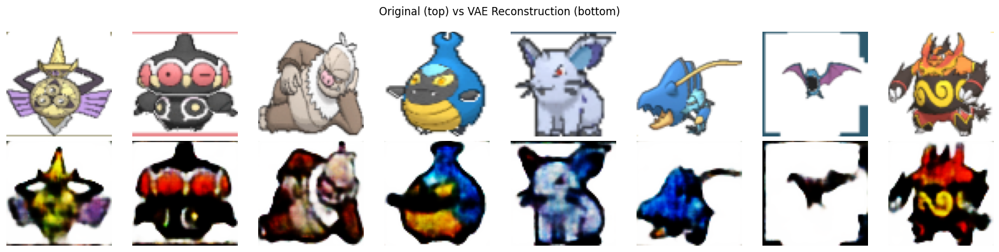

Epoch 26/50 | Loss: 898.4678
Epoch 27/50 | Loss: 895.5683
Epoch 28/50 | Loss: 891.9380
Epoch 29/50 | Loss: 889.2532
Epoch 30/50 | Loss: 887.5012
Epoch 31/50 | Loss: 883.9838
Epoch 32/50 | Loss: 881.8463
Epoch 33/50 | Loss: 879.5490
Epoch 34/50 | Loss: 877.6586
Epoch 35/50 | Loss: 875.7247
Epoch 36/50 | Loss: 873.9925
Epoch 37/50 | Loss: 871.4138
Epoch 38/50 | Loss: 870.4027
Epoch 39/50 | Loss: 868.3503
Epoch 40/50 | Loss: 866.5817
Epoch 41/50 | Loss: 864.6066
Epoch 42/50 | Loss: 864.0716
Epoch 43/50 | Loss: 862.7770
Epoch 44/50 | Loss: 860.7011
Epoch 45/50 | Loss: 860.5147
Epoch 46/50 | Loss: 858.8966
Epoch 47/50 | Loss: 857.2288
Epoch 48/50 | Loss: 855.8272
Epoch 49/50 | Loss: 854.8548
Epoch 50/50 | Loss: 854.1179


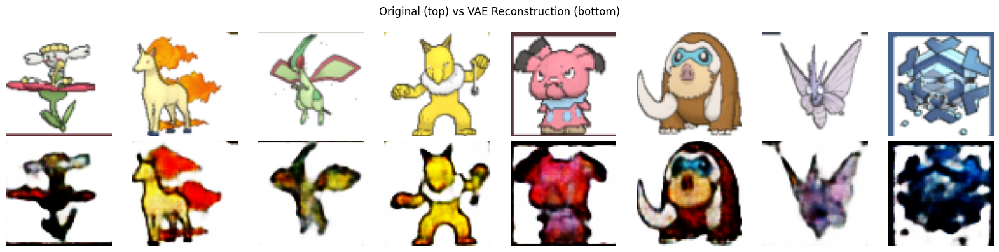

In [7]:
vae_a = ConvVAE(latent_dim=128)
losses_a = train_vae(vae_a, data_iter, num_epochs=50, lr=1e-3, device=device, viz_every=25)

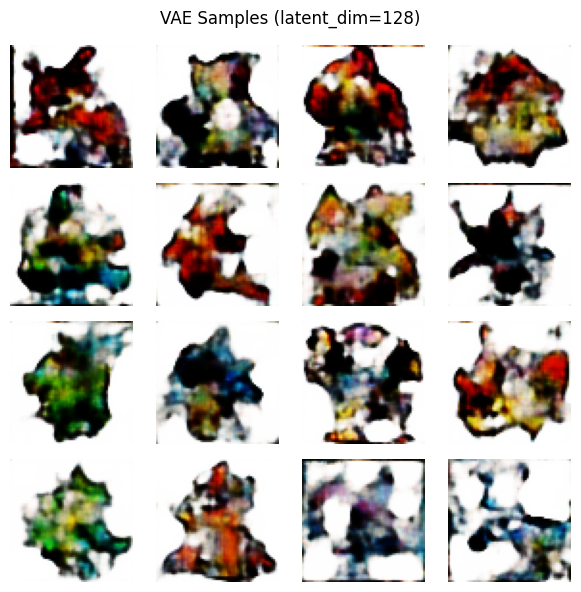

In [8]:
sample_vae(vae_a, num_samples=16, device=device)

#### Configuration B — latent_dim = 256, longer training

Epoch 1/100 | Loss: 2589.2488
Epoch 2/100 | Loss: 1851.4343
Epoch 3/100 | Loss: 1567.4486
Epoch 4/100 | Loss: 1413.2373
Epoch 5/100 | Loss: 1324.0069
Epoch 6/100 | Loss: 1258.0961
Epoch 7/100 | Loss: 1208.9023
Epoch 8/100 | Loss: 1170.7480
Epoch 9/100 | Loss: 1139.8114
Epoch 10/100 | Loss: 1114.4697
Epoch 11/100 | Loss: 1092.7056
Epoch 12/100 | Loss: 1072.8344
Epoch 13/100 | Loss: 1056.8867
Epoch 14/100 | Loss: 1043.0260
Epoch 15/100 | Loss: 1028.8900
Epoch 16/100 | Loss: 1018.6078
Epoch 17/100 | Loss: 1007.8460
Epoch 18/100 | Loss: 1000.1504
Epoch 19/100 | Loss: 990.7097
Epoch 20/100 | Loss: 983.0036
Epoch 21/100 | Loss: 975.4563
Epoch 22/100 | Loss: 970.1204
Epoch 23/100 | Loss: 963.4395
Epoch 24/100 | Loss: 957.2468
Epoch 25/100 | Loss: 952.1958
Epoch 26/100 | Loss: 946.5855
Epoch 27/100 | Loss: 942.6573
Epoch 28/100 | Loss: 938.8397
Epoch 29/100 | Loss: 933.7041
Epoch 30/100 | Loss: 929.8309
Epoch 31/100 | Loss: 926.7370
Epoch 32/100 | Loss: 922.7841
Epoch 33/100 | Loss: 919.2748
E

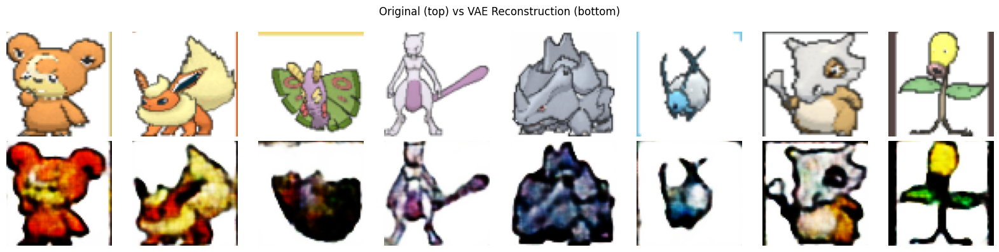

Epoch 51/100 | Loss: 879.3139
Epoch 52/100 | Loss: 877.0577
Epoch 53/100 | Loss: 875.7429
Epoch 54/100 | Loss: 873.9603
Epoch 55/100 | Loss: 873.6847
Epoch 56/100 | Loss: 871.6385
Epoch 57/100 | Loss: 870.0781
Epoch 58/100 | Loss: 868.6162
Epoch 59/100 | Loss: 868.6386
Epoch 60/100 | Loss: 866.6964
Epoch 61/100 | Loss: 865.0999
Epoch 62/100 | Loss: 863.9325
Epoch 63/100 | Loss: 863.0940
Epoch 64/100 | Loss: 862.5813
Epoch 65/100 | Loss: 861.0305
Epoch 66/100 | Loss: 859.9232
Epoch 67/100 | Loss: 859.9804
Epoch 68/100 | Loss: 858.1930
Epoch 69/100 | Loss: 857.6198
Epoch 70/100 | Loss: 856.4968
Epoch 71/100 | Loss: 855.0766
Epoch 72/100 | Loss: 854.4206
Epoch 73/100 | Loss: 853.7675
Epoch 74/100 | Loss: 853.3407
Epoch 75/100 | Loss: 852.2072
Epoch 76/100 | Loss: 851.5926
Epoch 77/100 | Loss: 850.2271
Epoch 78/100 | Loss: 849.8521
Epoch 79/100 | Loss: 849.1819
Epoch 80/100 | Loss: 848.1389
Epoch 81/100 | Loss: 847.5640
Epoch 82/100 | Loss: 846.8864
Epoch 83/100 | Loss: 845.9776
Epoch 84/1

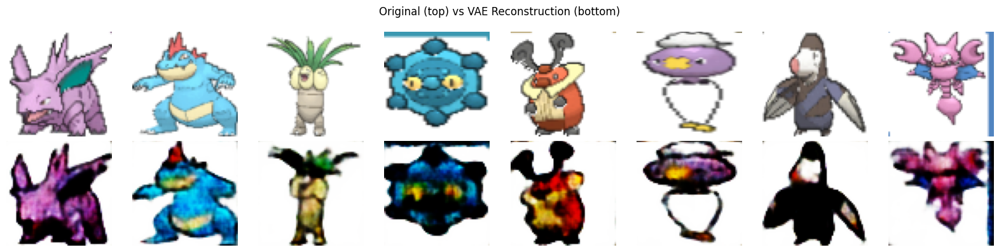

In [9]:
vae_b = ConvVAE(latent_dim=256)
losses_b = train_vae(vae_b, data_iter, num_epochs=100, lr=5e-4, device=device, viz_every=50)

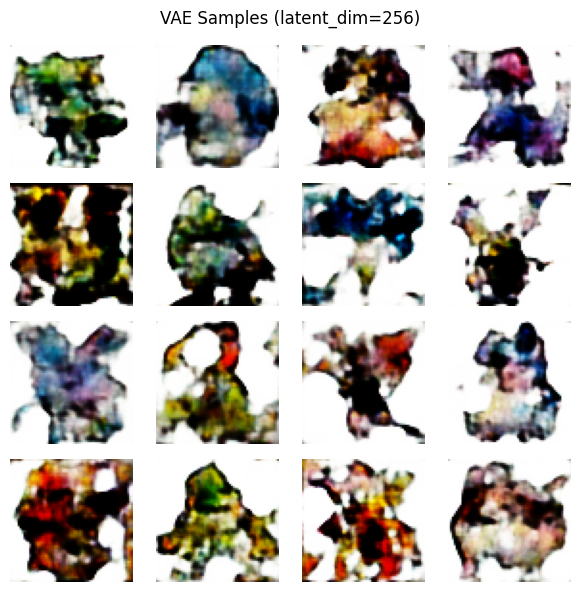

In [10]:
sample_vae(vae_b, num_samples=16, device=device)

#### Configuration C — latent_dim = 64 (smaller bottleneck)

Epoch 1/50 | Loss: 2404.7936
Epoch 2/50 | Loss: 1633.8843
Epoch 3/50 | Loss: 1361.6566
Epoch 4/50 | Loss: 1228.4917
Epoch 5/50 | Loss: 1155.6055
Epoch 6/50 | Loss: 1109.1609
Epoch 7/50 | Loss: 1076.9398
Epoch 8/50 | Loss: 1050.8857
Epoch 9/50 | Loss: 1030.4603
Epoch 10/50 | Loss: 1013.5828
Epoch 11/50 | Loss: 998.6047
Epoch 12/50 | Loss: 985.9888
Epoch 13/50 | Loss: 975.1916
Epoch 14/50 | Loss: 964.6328
Epoch 15/50 | Loss: 955.9538
Epoch 16/50 | Loss: 949.1164
Epoch 17/50 | Loss: 939.6820
Epoch 18/50 | Loss: 934.7210
Epoch 19/50 | Loss: 928.4315
Epoch 20/50 | Loss: 922.6358
Epoch 21/50 | Loss: 918.6478
Epoch 22/50 | Loss: 913.7324
Epoch 23/50 | Loss: 909.9079
Epoch 24/50 | Loss: 905.0833
Epoch 25/50 | Loss: 901.1793


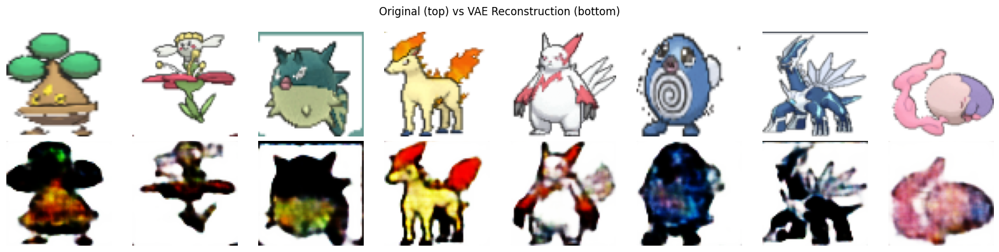

Epoch 26/50 | Loss: 898.1016
Epoch 27/50 | Loss: 895.4532
Epoch 28/50 | Loss: 893.3533
Epoch 29/50 | Loss: 889.1991
Epoch 30/50 | Loss: 886.3757
Epoch 31/50 | Loss: 883.7089
Epoch 32/50 | Loss: 883.5495
Epoch 33/50 | Loss: 879.6800
Epoch 34/50 | Loss: 877.3931
Epoch 35/50 | Loss: 875.9383
Epoch 36/50 | Loss: 874.2778
Epoch 37/50 | Loss: 871.2146
Epoch 38/50 | Loss: 869.9833
Epoch 39/50 | Loss: 868.6876
Epoch 40/50 | Loss: 868.3302
Epoch 41/50 | Loss: 865.1982
Epoch 42/50 | Loss: 863.7817
Epoch 43/50 | Loss: 862.5735
Epoch 44/50 | Loss: 860.6724
Epoch 45/50 | Loss: 859.7010
Epoch 46/50 | Loss: 859.2921
Epoch 47/50 | Loss: 856.6080
Epoch 48/50 | Loss: 856.1558
Epoch 49/50 | Loss: 854.6185
Epoch 50/50 | Loss: 853.6715


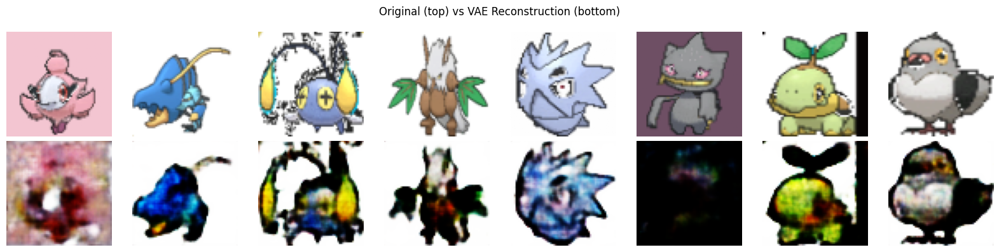

In [11]:
vae_c = ConvVAE(latent_dim=64)
losses_c = train_vae(vae_c, data_iter, num_epochs=50, lr=1e-3, device=device, viz_every=25)

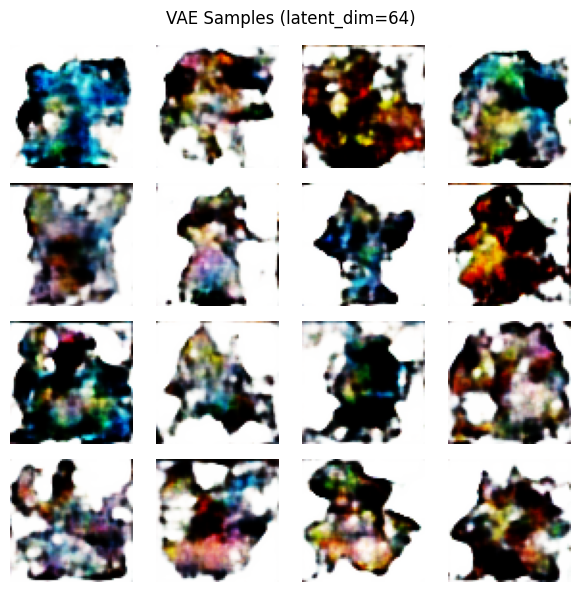

In [12]:
sample_vae(vae_c, num_samples=16, device=device)

### 2.4 Loss Comparison Across Configurations

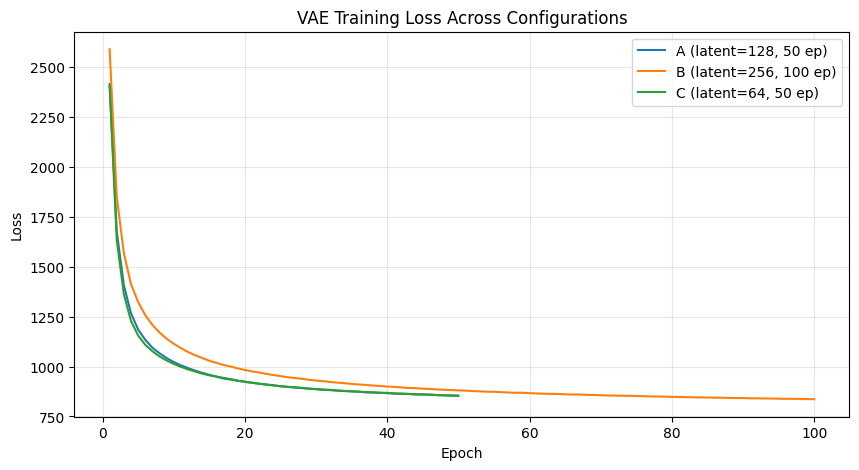

In [13]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(losses_a) + 1), losses_a, label='A (latent=128, 50 ep)')
plt.plot(range(1, len(losses_b) + 1), losses_b, label='B (latent=256, 100 ep)')
plt.plot(range(1, len(losses_c) + 1), losses_c, label='C (latent=64, 50 ep)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('VAE Training Loss Across Configurations')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## 3. Part 2 — Deep Convolutional GAN (DCGAN)

### 3.1 Generator & Discriminator

The generator uses 4 transposed convolutions with BatchNorm + ReLU, and a final Tanh activation. The discriminator mirrors this with strided convolutions + LeakyReLU.

In [14]:
class G_block(nn.Module):
    """Generator block: ConvTranspose -> BatchNorm -> ReLU."""
    def __init__(self, out_channels, in_channels=3, kernel_size=4, strides=2, padding=1):
        super().__init__()
        self.conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, strides, padding, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.ReLU()

    def forward(self, x):
        return self.act(self.bn(self.conv(x)))


class D_block(nn.Module):
    """Discriminator block: Conv -> BatchNorm -> LeakyReLU."""
    def __init__(self, out_channels, in_channels=3, kernel_size=4, strides=2, padding=1, alpha=0.2):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, strides, padding, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(alpha, inplace=True)

    def forward(self, x):
        return self.act(self.bn(self.conv(x)))


def build_generator(latent_dim=100, n_G=64):
    return nn.Sequential(
        G_block(in_channels=latent_dim, out_channels=n_G * 8, strides=1, padding=0),  # 4x4
        G_block(in_channels=n_G * 8, out_channels=n_G * 4),  # 8x8
        G_block(in_channels=n_G * 4, out_channels=n_G * 2),  # 16x16
        G_block(in_channels=n_G * 2, out_channels=n_G),       # 32x32
        nn.ConvTranspose2d(n_G, 3, kernel_size=4, stride=2, padding=1, bias=False),  # 64x64
        nn.Tanh()
    )


def build_discriminator(n_D=64):
    return nn.Sequential(
        D_block(n_D),                                         # 32x32
        D_block(in_channels=n_D, out_channels=n_D * 2),       # 16x16
        D_block(in_channels=n_D * 2, out_channels=n_D * 4),   # 8x8
        D_block(in_channels=n_D * 4, out_channels=n_D * 8),   # 4x4
        nn.Conv2d(n_D * 8, 1, kernel_size=4, bias=False)      # 1x1
    )

### 3.2 Training with Label Smoothing

Two techniques are added to stabilize GAN training and improve generation quality:

- **One-sided label smoothing**: real labels = 0.9 instead of 1.0 — prevents the discriminator from becoming too confident
- **Weight initialization**: normal distribution with std=0.02 (DCGAN standard)


In [15]:
def update_D(X, Z, net_D, net_G, loss_fn, trainer_D, real_label_value=0.9):
    """Update discriminator with one-sided label smoothing."""
    batch_size = X.shape[0]
    device = X.device
    real_labels = torch.full((batch_size,), real_label_value, device=device)
    fake_labels = torch.zeros(batch_size, device=device)

    trainer_D.zero_grad()
    outputs_real = net_D(X).reshape(-1)
    loss_real = loss_fn(outputs_real, real_labels)
    loss_real.backward()

    fake_images = net_G(Z)
    outputs_fake = net_D(fake_images.detach()).reshape(-1)
    loss_fake = loss_fn(outputs_fake, fake_labels)
    loss_fake.backward()

    trainer_D.step()
    return (loss_real + loss_fake).item()


def update_G(Z, net_D, net_G, loss_fn, trainer_G):
    """Update generator (uses real labels=1.0 since the generator wants to fool D)."""
    batch_size = Z.shape[0]
    device = Z.device
    real_labels = torch.ones(batch_size, device=device)

    trainer_G.zero_grad()
    fake_images = net_G(Z)
    outputs = net_D(fake_images).reshape(-1)
    loss_G = loss_fn(outputs, real_labels)
    loss_G.backward()
    trainer_G.step()
    return loss_G.item()


def train_gan(net_D, net_G, data_iter, num_epochs, lr, latent_dim, device, viz_every=10):
    """Full DCGAN training loop with periodic visualization."""
    loss_fn = nn.BCEWithLogitsLoss(reduction='sum')

    # DCGAN-style weight initialization
    for w in net_D.parameters():
        nn.init.normal_(w, 0, 0.02)
    for w in net_G.parameters():
        nn.init.normal_(w, 0, 0.02)

    net_D, net_G = net_D.to(device), net_G.to(device)
    trainer_D = torch.optim.Adam(net_D.parameters(), lr=lr, betas=(0.5, 0.999))
    trainer_G = torch.optim.Adam(net_G.parameters(), lr=lr, betas=(0.5, 0.999))

    loss_D_list, loss_G_list = [], []

    for epoch in range(1, num_epochs + 1):
        epoch_D, epoch_G, n_samples = 0, 0, 0
        for X, _ in data_iter:
            batch_size = X.shape[0]
            Z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            X = X.to(device)

            loss_D = update_D(X, Z, net_D, net_G, loss_fn, trainer_D)
            loss_G = update_G(Z, net_D, net_G, loss_fn, trainer_G)
            epoch_D += loss_D
            epoch_G += loss_G
            n_samples += batch_size

        avg_D = epoch_D / n_samples
        avg_G = epoch_G / n_samples
        loss_D_list.append(avg_D)
        loss_G_list.append(avg_G)
        print(f'Epoch {epoch}/{num_epochs} | loss_D: {avg_D:.4f} | loss_G: {avg_G:.4f}')

        if epoch % viz_every == 0 or epoch == num_epochs:
            show_gan_samples(net_G, latent_dim, device, epoch)

    return loss_D_list, loss_G_list


def show_gan_samples(net_G, latent_dim, device, epoch=None, n=21):
    """Display generated samples in a 3x7 grid."""
    net_G.eval()
    with torch.no_grad():
        Z = torch.randn(n, latent_dim, 1, 1, device=device)
        fake = net_G(Z).permute(0, 2, 3, 1) / 2 + 0.5
        fake = fake.cpu().numpy()

    fig, axes = plt.subplots(3, 7, figsize=(14, 6))
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(fake[i])
        ax.axis('off')
    title = f'Generated Samples (Epoch {epoch})' if epoch else 'Generated Samples'
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    net_G.train()

### 3.3 GAN Configurations

| Config | Latent dim | Epochs | LR |
|--------|-----------|--------|------|
| A | 100 | 100 | 2e-4 |
| B | 128 | 80  | 5e-4 |

**Note:** GANs on small datasets like Pokemon (~900 sprites) are notoriously difficult — expect blurry or noisy samples. Configuration A uses the standard DCGAN hyperparameters; Configuration B uses a higher learning rate and a larger latent space.

#### Configuration A — Standard DCGAN settings

Epoch 1/100 | loss_D: 0.6421 | loss_G: 2.6026
Epoch 2/100 | loss_D: 0.7364 | loss_G: 2.9348
Epoch 3/100 | loss_D: 0.6979 | loss_G: 3.1376
Epoch 4/100 | loss_D: 0.7500 | loss_G: 3.1076
Epoch 5/100 | loss_D: 0.7288 | loss_G: 3.3312
Epoch 6/100 | loss_D: 0.7642 | loss_G: 3.3008
Epoch 7/100 | loss_D: 0.7347 | loss_G: 3.2467
Epoch 8/100 | loss_D: 0.7032 | loss_G: 3.3617
Epoch 9/100 | loss_D: 0.6871 | loss_G: 3.4797
Epoch 10/100 | loss_D: 0.6863 | loss_G: 3.4150
Epoch 11/100 | loss_D: 0.6516 | loss_G: 3.4415
Epoch 12/100 | loss_D: 0.6620 | loss_G: 3.4441
Epoch 13/100 | loss_D: 0.6740 | loss_G: 3.4107
Epoch 14/100 | loss_D: 0.6627 | loss_G: 3.3115
Epoch 15/100 | loss_D: 0.6895 | loss_G: 3.1900
Epoch 16/100 | loss_D: 0.6880 | loss_G: 3.0836
Epoch 17/100 | loss_D: 0.6937 | loss_G: 2.8789
Epoch 18/100 | loss_D: 0.6837 | loss_G: 2.8766
Epoch 19/100 | loss_D: 0.6846 | loss_G: 2.6281
Epoch 20/100 | loss_D: 0.6722 | loss_G: 2.6844


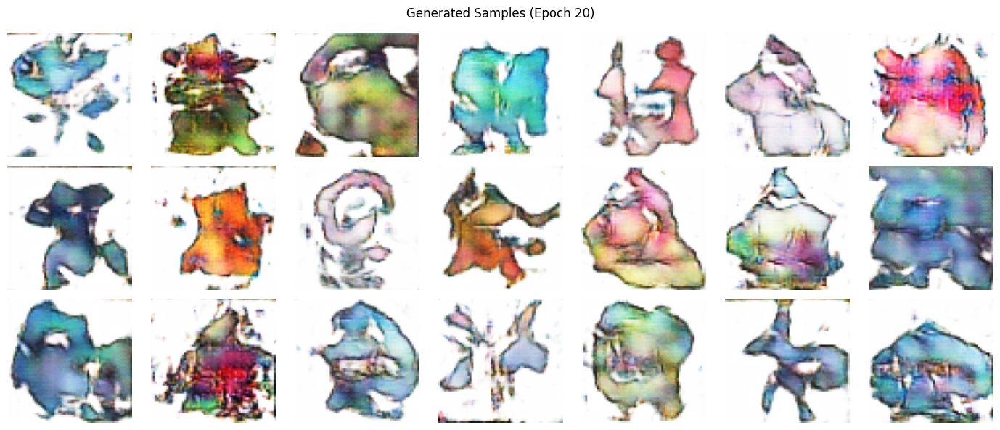

Epoch 21/100 | loss_D: 0.6662 | loss_G: 2.6336
Epoch 22/100 | loss_D: 0.6155 | loss_G: 2.7799
Epoch 23/100 | loss_D: 0.6021 | loss_G: 2.8897
Epoch 24/100 | loss_D: 0.5585 | loss_G: 3.0091
Epoch 25/100 | loss_D: 0.6149 | loss_G: 2.9544
Epoch 26/100 | loss_D: 0.5890 | loss_G: 3.0890
Epoch 27/100 | loss_D: 0.5203 | loss_G: 3.2371
Epoch 28/100 | loss_D: 0.4956 | loss_G: 3.3740
Epoch 29/100 | loss_D: 0.5669 | loss_G: 3.2824
Epoch 30/100 | loss_D: 0.4903 | loss_G: 3.4953
Epoch 31/100 | loss_D: 0.4799 | loss_G: 3.6005
Epoch 32/100 | loss_D: 0.5009 | loss_G: 3.6309
Epoch 33/100 | loss_D: 0.4321 | loss_G: 3.8726
Epoch 34/100 | loss_D: 0.6451 | loss_G: 3.4520
Epoch 35/100 | loss_D: 0.4236 | loss_G: 3.8022
Epoch 36/100 | loss_D: 0.4511 | loss_G: 3.9425
Epoch 37/100 | loss_D: 0.4266 | loss_G: 4.1751
Epoch 38/100 | loss_D: 0.5438 | loss_G: 4.0227
Epoch 39/100 | loss_D: 0.3999 | loss_G: 4.0430
Epoch 40/100 | loss_D: 0.3950 | loss_G: 4.3576


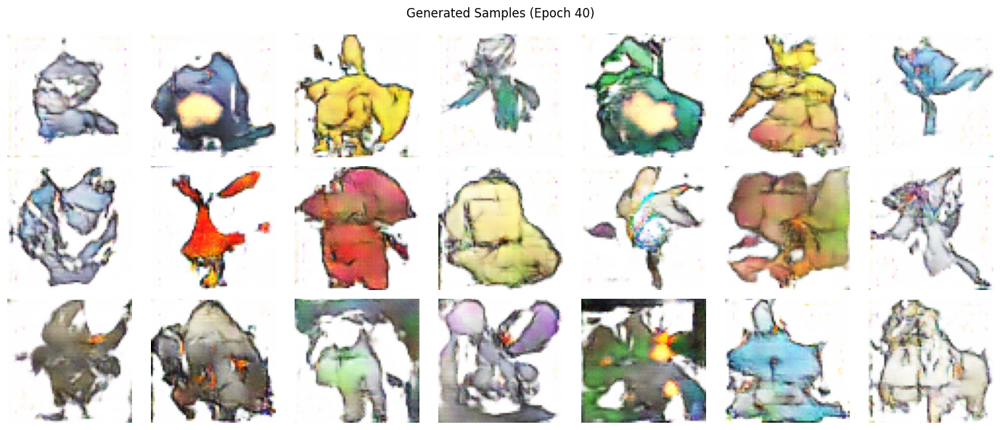

Epoch 41/100 | loss_D: 0.4862 | loss_G: 4.0620
Epoch 42/100 | loss_D: 0.3803 | loss_G: 4.5177
Epoch 43/100 | loss_D: 0.3993 | loss_G: 4.5729
Epoch 44/100 | loss_D: 0.4676 | loss_G: 4.5194
Epoch 45/100 | loss_D: 0.3797 | loss_G: 4.4998
Epoch 46/100 | loss_D: 0.3759 | loss_G: 4.7819
Epoch 47/100 | loss_D: 0.3907 | loss_G: 4.8247
Epoch 48/100 | loss_D: 0.4198 | loss_G: 4.8103
Epoch 49/100 | loss_D: 0.3794 | loss_G: 4.9258
Epoch 50/100 | loss_D: 0.3850 | loss_G: 5.1293
Epoch 51/100 | loss_D: 0.3786 | loss_G: 5.1033
Epoch 52/100 | loss_D: 0.3768 | loss_G: 5.1417
Epoch 53/100 | loss_D: 0.3883 | loss_G: 5.1617
Epoch 54/100 | loss_D: 0.4360 | loss_G: 5.0103
Epoch 55/100 | loss_D: 0.3698 | loss_G: 5.1704
Epoch 56/100 | loss_D: 0.3856 | loss_G: 5.1346
Epoch 57/100 | loss_D: 0.3860 | loss_G: 5.1867
Epoch 58/100 | loss_D: 0.3611 | loss_G: 5.4437
Epoch 59/100 | loss_D: 0.4189 | loss_G: 5.4405
Epoch 60/100 | loss_D: 0.3693 | loss_G: 5.4034


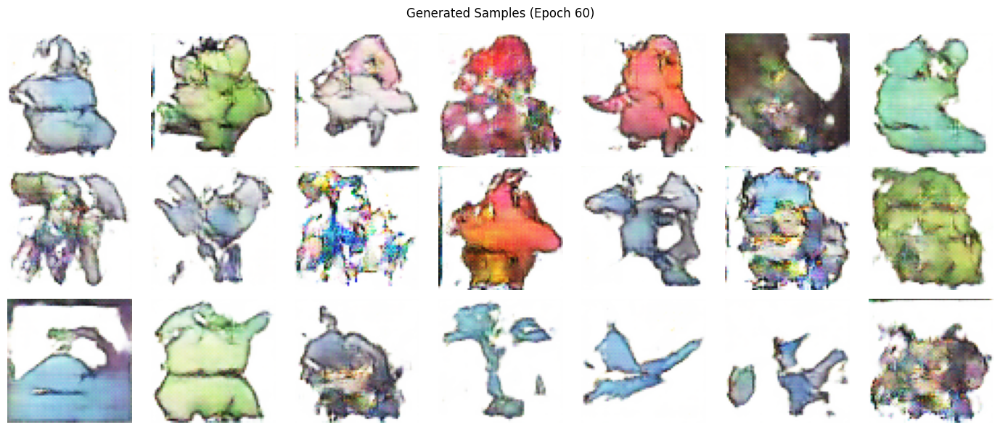

Epoch 61/100 | loss_D: 0.3684 | loss_G: 5.2680
Epoch 62/100 | loss_D: 0.3687 | loss_G: 5.3346
Epoch 63/100 | loss_D: 0.3809 | loss_G: 5.3881
Epoch 64/100 | loss_D: 0.3811 | loss_G: 5.4158
Epoch 65/100 | loss_D: 0.3611 | loss_G: 5.4064
Epoch 66/100 | loss_D: 0.3812 | loss_G: 5.4954
Epoch 67/100 | loss_D: 0.3596 | loss_G: 5.7258
Epoch 68/100 | loss_D: 0.3667 | loss_G: 5.5721
Epoch 69/100 | loss_D: 0.3682 | loss_G: 5.5918
Epoch 70/100 | loss_D: 0.3596 | loss_G: 5.5438
Epoch 71/100 | loss_D: 0.3735 | loss_G: 5.5116
Epoch 72/100 | loss_D: 0.3676 | loss_G: 5.6013
Epoch 73/100 | loss_D: 0.3557 | loss_G: 5.6642
Epoch 74/100 | loss_D: 0.3586 | loss_G: 5.6346
Epoch 75/100 | loss_D: 0.3674 | loss_G: 5.6544
Epoch 76/100 | loss_D: 0.3568 | loss_G: 5.5313
Epoch 77/100 | loss_D: 0.3549 | loss_G: 5.5712
Epoch 78/100 | loss_D: 0.3562 | loss_G: 5.6172
Epoch 79/100 | loss_D: 0.3564 | loss_G: 5.6942
Epoch 80/100 | loss_D: 0.5012 | loss_G: 5.0868


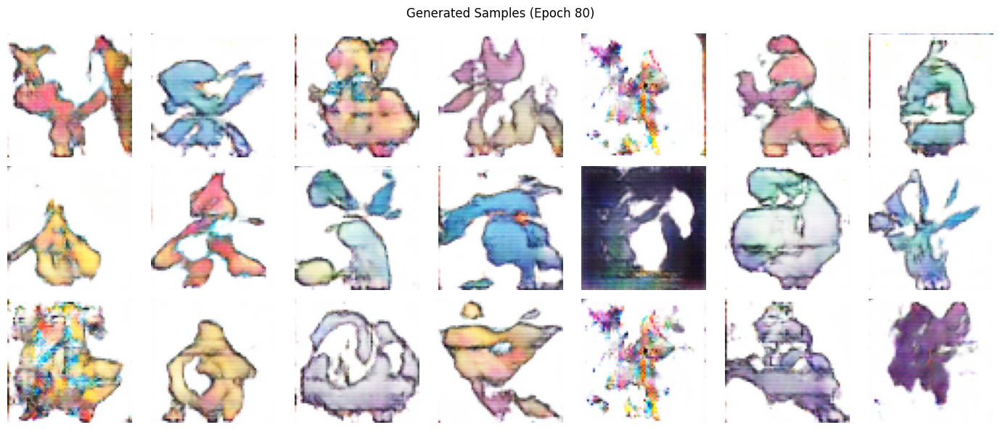

Epoch 81/100 | loss_D: 0.3672 | loss_G: 5.0221
Epoch 82/100 | loss_D: 0.3677 | loss_G: 5.2316
Epoch 83/100 | loss_D: 0.3613 | loss_G: 5.4939
Epoch 84/100 | loss_D: 0.3609 | loss_G: 5.4901
Epoch 85/100 | loss_D: 0.3540 | loss_G: 5.6679
Epoch 86/100 | loss_D: 0.3596 | loss_G: 5.5614
Epoch 87/100 | loss_D: 0.3561 | loss_G: 5.7701
Epoch 88/100 | loss_D: 0.3593 | loss_G: 5.7810
Epoch 89/100 | loss_D: 0.3524 | loss_G: 5.6979
Epoch 90/100 | loss_D: 0.3530 | loss_G: 5.6833
Epoch 91/100 | loss_D: 0.3549 | loss_G: 5.7734
Epoch 92/100 | loss_D: 0.3541 | loss_G: 5.8466
Epoch 93/100 | loss_D: 0.3476 | loss_G: 5.8606
Epoch 94/100 | loss_D: 0.3472 | loss_G: 5.8694
Epoch 95/100 | loss_D: 0.3589 | loss_G: 5.8940
Epoch 96/100 | loss_D: 0.3498 | loss_G: 5.8342
Epoch 97/100 | loss_D: 0.3506 | loss_G: 5.8845
Epoch 98/100 | loss_D: 0.3478 | loss_G: 5.9036
Epoch 99/100 | loss_D: 0.4493 | loss_G: 5.6445
Epoch 100/100 | loss_D: 0.3625 | loss_G: 5.3795


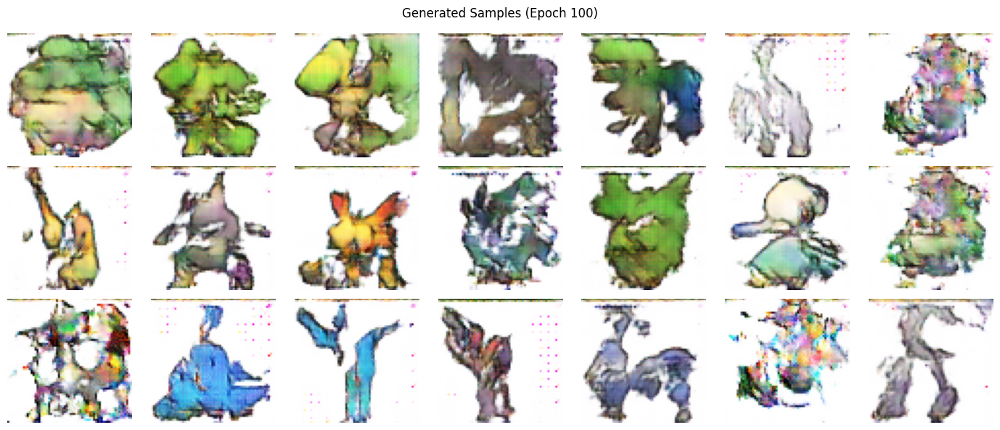

In [16]:
# Build models
net_G_a = build_generator(latent_dim=100)
net_D_a = build_discriminator()

losses_D_a, losses_G_a = train_gan(
    net_D_a, net_G_a, data_iter,
    num_epochs=100, lr=2e-4, latent_dim=100,
    device=device, viz_every=20
)

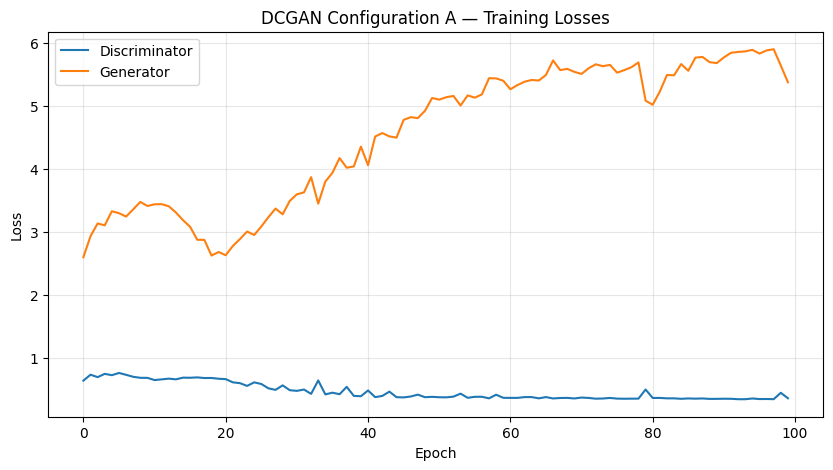

In [17]:
# Loss curves
plt.figure(figsize=(10, 5))
plt.plot(losses_D_a, label='Discriminator')
plt.plot(losses_G_a, label='Generator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('DCGAN Configuration A — Training Losses')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

#### Configuration B — Larger latent + higher LR

Epoch 1/80 | loss_D: 0.8297 | loss_G: 2.5004
Epoch 2/80 | loss_D: 0.9262 | loss_G: 2.8024
Epoch 3/80 | loss_D: 0.8520 | loss_G: 3.1900
Epoch 4/80 | loss_D: 0.8831 | loss_G: 3.1982
Epoch 5/80 | loss_D: 0.7911 | loss_G: 3.4246
Epoch 6/80 | loss_D: 0.7228 | loss_G: 3.7539
Epoch 7/80 | loss_D: 0.6855 | loss_G: 3.6419
Epoch 8/80 | loss_D: 0.6993 | loss_G: 3.5602
Epoch 9/80 | loss_D: 0.6694 | loss_G: 3.3943
Epoch 10/80 | loss_D: 0.6206 | loss_G: 3.5352
Epoch 11/80 | loss_D: 0.6313 | loss_G: 3.4193
Epoch 12/80 | loss_D: 0.5779 | loss_G: 3.6386
Epoch 13/80 | loss_D: 0.5828 | loss_G: 3.6667
Epoch 14/80 | loss_D: 0.6120 | loss_G: 3.4771
Epoch 15/80 | loss_D: 0.4967 | loss_G: 3.7076
Epoch 16/80 | loss_D: 0.5152 | loss_G: 3.8536
Epoch 17/80 | loss_D: 0.6088 | loss_G: 3.5853
Epoch 18/80 | loss_D: 0.4513 | loss_G: 4.1052
Epoch 19/80 | loss_D: 0.5185 | loss_G: 3.9474
Epoch 20/80 | loss_D: 0.4450 | loss_G: 4.2973


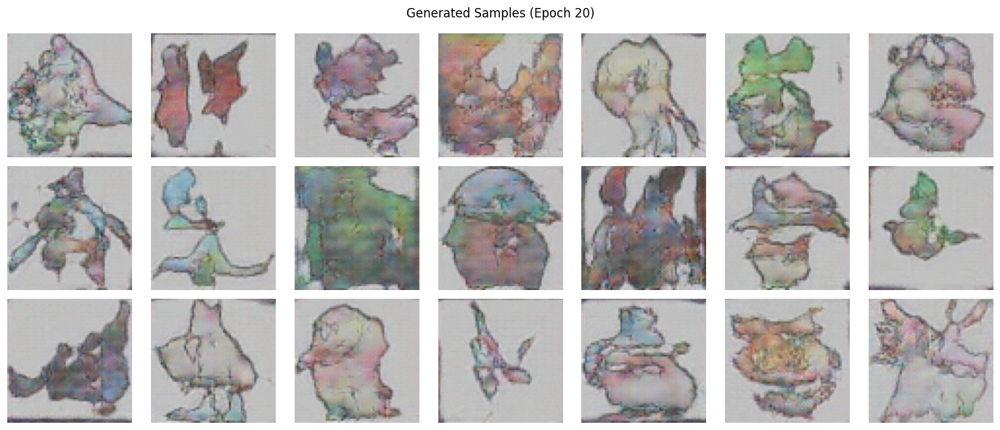

Epoch 21/80 | loss_D: 0.6945 | loss_G: 3.6634
Epoch 22/80 | loss_D: 0.4420 | loss_G: 4.0541
Epoch 23/80 | loss_D: 0.4293 | loss_G: 4.3603
Epoch 24/80 | loss_D: 0.4573 | loss_G: 4.6514
Epoch 25/80 | loss_D: 0.4838 | loss_G: 4.2093
Epoch 26/80 | loss_D: 0.3952 | loss_G: 4.6932
Epoch 27/80 | loss_D: 0.3909 | loss_G: 4.8588
Epoch 28/80 | loss_D: 0.5671 | loss_G: 4.1888
Epoch 29/80 | loss_D: 0.3818 | loss_G: 4.6914
Epoch 30/80 | loss_D: 0.3883 | loss_G: 4.9172
Epoch 31/80 | loss_D: 0.3904 | loss_G: 5.0233
Epoch 32/80 | loss_D: 0.3927 | loss_G: 5.0434
Epoch 33/80 | loss_D: 0.3696 | loss_G: 5.2230
Epoch 34/80 | loss_D: 0.3840 | loss_G: 5.1542
Epoch 35/80 | loss_D: 0.3777 | loss_G: 5.2394
Epoch 36/80 | loss_D: 0.5388 | loss_G: 4.5678
Epoch 37/80 | loss_D: 0.3758 | loss_G: 4.8978
Epoch 38/80 | loss_D: 0.3666 | loss_G: 5.2066
Epoch 39/80 | loss_D: 0.4497 | loss_G: 5.1290
Epoch 40/80 | loss_D: 0.3745 | loss_G: 4.9794


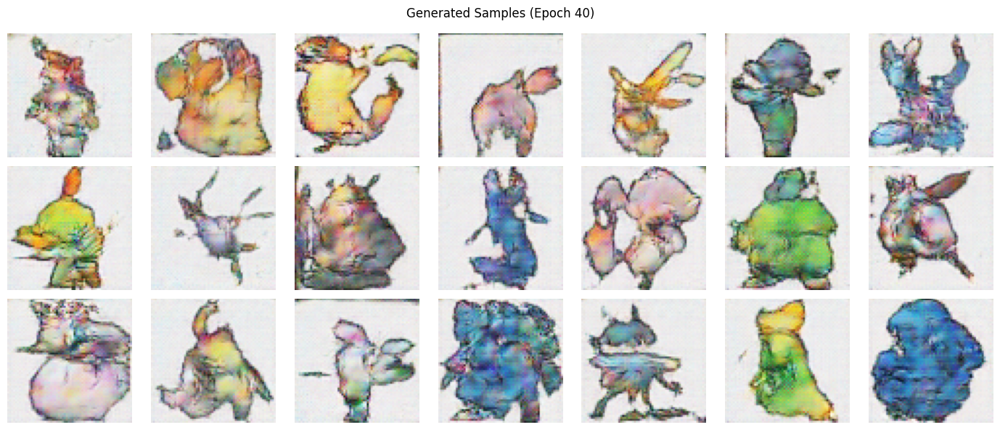

Epoch 41/80 | loss_D: 0.3616 | loss_G: 5.3243
Epoch 42/80 | loss_D: 0.3591 | loss_G: 5.4345
Epoch 43/80 | loss_D: 0.3584 | loss_G: 5.5109
Epoch 44/80 | loss_D: 0.3635 | loss_G: 5.4706
Epoch 45/80 | loss_D: 0.3655 | loss_G: 5.4402
Epoch 46/80 | loss_D: 0.3622 | loss_G: 5.4991
Epoch 47/80 | loss_D: 0.3755 | loss_G: 5.4523
Epoch 48/80 | loss_D: 0.3564 | loss_G: 5.5945
Epoch 49/80 | loss_D: 0.3610 | loss_G: 5.5619
Epoch 50/80 | loss_D: 0.8206 | loss_G: 4.0441
Epoch 51/80 | loss_D: 0.3803 | loss_G: 4.6172
Epoch 52/80 | loss_D: 0.3646 | loss_G: 5.0015
Epoch 53/80 | loss_D: 0.3666 | loss_G: 5.1692
Epoch 54/80 | loss_D: 0.3572 | loss_G: 5.4442
Epoch 55/80 | loss_D: 0.3580 | loss_G: 5.5364
Epoch 56/80 | loss_D: 0.3685 | loss_G: 5.4564
Epoch 57/80 | loss_D: 0.3530 | loss_G: 5.6148
Epoch 58/80 | loss_D: 0.3530 | loss_G: 5.6982
Epoch 59/80 | loss_D: 0.3548 | loss_G: 5.6850
Epoch 60/80 | loss_D: 0.3610 | loss_G: 5.6269


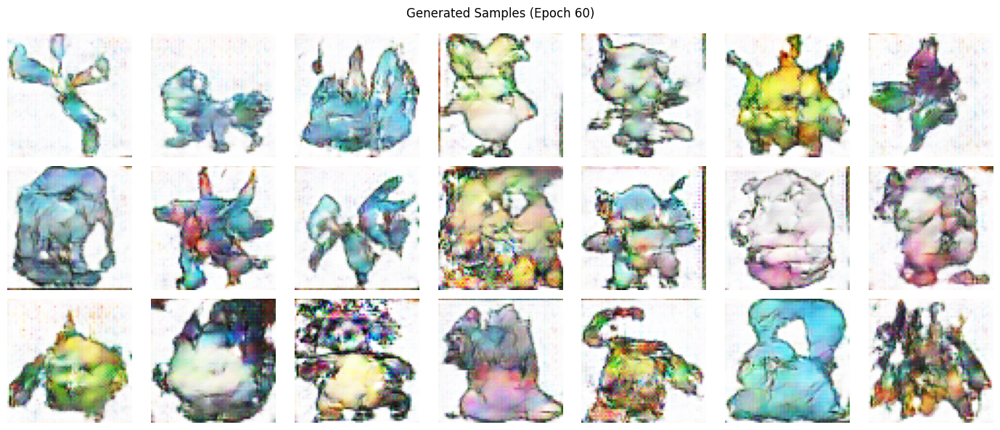

Epoch 61/80 | loss_D: 0.3555 | loss_G: 5.6486
Epoch 62/80 | loss_D: 0.3691 | loss_G: 5.6477
Epoch 63/80 | loss_D: 0.3503 | loss_G: 5.7793
Epoch 64/80 | loss_D: 0.3569 | loss_G: 5.7127
Epoch 65/80 | loss_D: 0.3503 | loss_G: 5.8205
Epoch 66/80 | loss_D: 0.3526 | loss_G: 5.8953
Epoch 67/80 | loss_D: 0.6191 | loss_G: 4.5982
Epoch 68/80 | loss_D: 0.3641 | loss_G: 5.1039
Epoch 69/80 | loss_D: 0.3536 | loss_G: 5.4215
Epoch 70/80 | loss_D: 0.3529 | loss_G: 5.5740
Epoch 71/80 | loss_D: 0.3504 | loss_G: 5.6796
Epoch 72/80 | loss_D: 0.3473 | loss_G: 5.8274
Epoch 73/80 | loss_D: 0.4028 | loss_G: 5.6307
Epoch 74/80 | loss_D: 0.3555 | loss_G: 5.6146
Epoch 75/80 | loss_D: 0.3497 | loss_G: 5.7481
Epoch 76/80 | loss_D: 0.3469 | loss_G: 5.8330
Epoch 77/80 | loss_D: 0.3474 | loss_G: 5.8829
Epoch 78/80 | loss_D: 0.3460 | loss_G: 5.9672
Epoch 79/80 | loss_D: 0.3460 | loss_G: 5.9670
Epoch 80/80 | loss_D: 0.3982 | loss_G: 5.7453


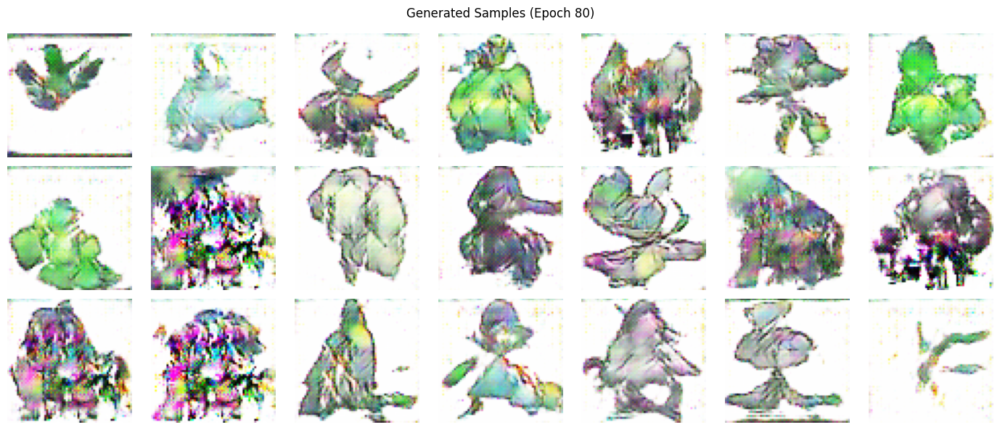

In [18]:
net_G_b = build_generator(latent_dim=128)
net_D_b = build_discriminator()

losses_D_b, losses_G_b = train_gan(
    net_D_b, net_G_b, data_iter,
    num_epochs=80, lr=5e-4, latent_dim=128,
    device=device, viz_every=20
)

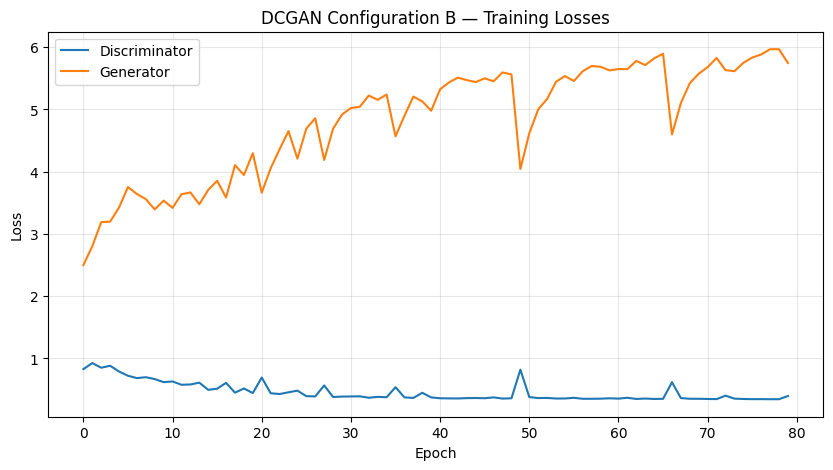

In [19]:
# Loss curves
plt.figure(figsize=(10, 5))
plt.plot(losses_D_b, label='Discriminator')
plt.plot(losses_G_b, label='Generator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('DCGAN Configuration B — Training Losses')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## 4. Discussion

### VAE
- Reconstructions are recognizable but blurry — typical of VAEs trained with MSE loss
- Larger latent dimensions (256) capture finer details but require more epochs to converge
- A smaller latent space (64) loses detail but trains faster

### DCGAN
- Generated samples are sharper than VAE outputs but suffer from mode collapse on small datasets
- Standard DCGAN hyperparameters (lr=2e-4, betas=(0.5, 0.999)) are more stable than aggressive learning rates
- Label smoothing helps prevent the discriminator from becoming too dominant

### Trade-off summary
| Aspect | VAE | DCGAN |
|--------|-----|-------|
| Sample sharpness | Blurry | Sharp |
| Training stability | Stable | Unstable, mode collapse |
| Reconstruction | Yes | No |
| Sample diversity | Good | Risk of collapse |

### Possible improvements
- Use **perceptual loss** (VGG features) instead of MSE for VAE
- Try **WGAN-GP** or **StyleGAN2** for sharper, more diverse GAN samples
- Apply **data augmentation** (flips, color jitter) given the small dataset size
- Use a pre-trained model on a similar domain via transfer learning